
## Download libraries
---




In [1]:
!pip install transformers datasets
!pip install ultralytics
!pip install supervision

from IPython import display

display.clear_output()

## Import

In [2]:
import torch
import torchvision
from torchvision import transforms
from datasets import load_dataset
from transformers import CLIPProcessor, CLIPModel
import numpy as np
import supervision as sv
from ultralytics import YOLO
import ultralytics
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Download model

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = CLIPModel.from_pretrained("FreddyFazbear0209/CLIP_for_visual_recognition").to(device)
processor = CLIPProcessor.from_pretrained("FreddyFazbear0209/CLIP_for_visual_recognition")

The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/504 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/964 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

In [4]:
model

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05,

In [5]:
total_params = sum(p.numel() for p in model.parameters())
print(total_params)

427616513


In [6]:
yolo = YOLO('yolov8n.pt').to(device)

## Setup config

In [7]:
CLASS_NAMES_DICT = yolo.model.names
SELECTED_CLASS_NAMES = ['person']
SELECTED_CLASS_IDS = [{value: key for key, value in CLASS_NAMES_DICT.items()}[class_name] for class_name in SELECTED_CLASS_NAMES]

box_annotator = sv.BoxAnnotator(thickness=2)

label_annotator = sv.LabelAnnotator(
    text_thickness=1,
    text_scale=1,
    text_color=sv.Color.BLACK
)

## Functions

In [8]:
def crop_images_from_detections(image, detections):
    cropped_images = []
    for det in detections:
        x_min, y_min, x_max, y_max = det  # [x_min, y_min, x_max, y_max, conf]
        x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])

        x_min = max(0, x_min)
        y_min = max(0, y_min)
        x_max = min(image.shape[1], x_max)
        y_max = min(image.shape[0], y_max)

        if x_max > x_min and y_max > y_min:
            cropped_image = image[y_min:y_max, x_min:x_max, :]
            cropped_images.append(cropped_image)
    return cropped_images


def preprocess_images(images):
    preprocess = transforms.Compose([
        transforms.ToTensor(),                       # (H,W,3) uint8 -> (3,H,W) float [0,1]
        transforms.Resize((224, 224)),               # resize về 224x224
        transforms.Normalize(                        # chuẩn hóa theo CLIP
            mean=(0.48145466, 0.4578275, 0.40821073),
            std=(0.26862954, 0.26130258, 0.27577711),
        )
    ])

    return preprocess(images)


def object_detection(yolo, path):
  frame = cv2.imread(path)

  results = yolo(frame, verbose=False)[0]
  detections = sv.Detections.from_ultralytics(results)
  detections = detections[np.isin(detections.class_id, SELECTED_CLASS_IDS)]

  labels = [
    f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
    for confidence, class_id in zip(detections.confidence, detections.class_id)
  ]
  annotated_frame = frame.copy()

  annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections
  )

  annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels
  )

  return annotated_frame


def zero_shot_object_detection(yolo, clip, processor, text, path):
    frame = cv2.imread(path)

    results = yolo(frame, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = detections[np.isin(detections.class_id, SELECTED_CLASS_IDS)]

    cropped_images = crop_images_from_detections(frame, detections.xyxy)

    image_tensors = [preprocess_images(img) for img in cropped_images]
    image_tensors = torch.stack(image_tensors).to(device)


    text_inputs = processor(text=[text], return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        text_embeds = model.get_text_features(**text_inputs)
        image_embeds = model.get_image_features(pixel_values=image_tensors)

    image_embeds = image_embeds / image_embeds.norm(dim=-1, keepdim=True)
    text_embeds = text_embeds / text_embeds.norm(dim=-1, keepdim=True)

    similarities = (text_embeds @ image_embeds.T).squeeze(0)

    max_idx = torch.argmax(similarities, dim=None, keepdim=False).item()
    detections_matched = detections[max_idx]

    labels = [
      f"{text}" for detection in detections_matched
    ]

    annotated_frame = frame.copy()

    annotated_frame = box_annotator.annotate(
        scene=annotated_frame,
        detections=detections_matched
    )

    # annotated_frame = label_annotator.annotate(
    #     scene=annotated_frame,
    #     detections=detections_matched,
    #     labels=labels
    # )

    return annotated_frame

## Object Detection

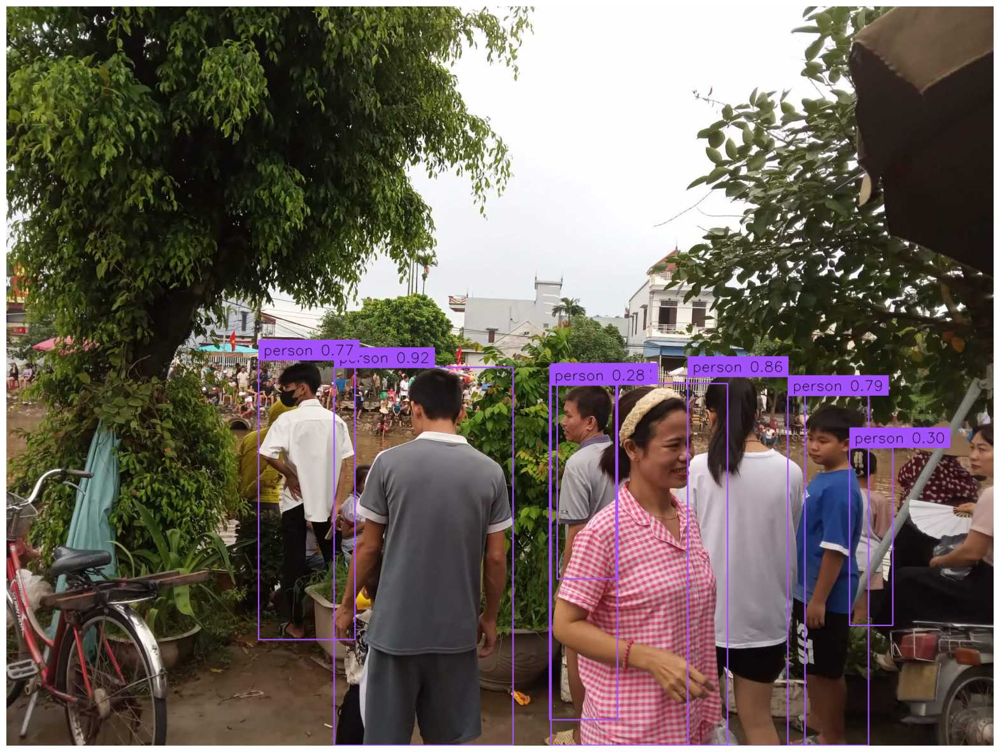

In [9]:
object_detection_img = object_detection(yolo, 'self2.jpg')
sv.plot_image(object_detection_img, (20, 20))

## Zero Shot Object Detection

### people_walking

In [ ]:
#1
#"woman, upper body wears brown shirt, short sleeve, lower body wears long black trousers"  1
#"Man, black skin, purple Tshirt short sleeves, black hair, lower body long black trousers" 1
#"Man, blonde hair, up body wear black sweater long sleeves, lower body wears jean"         1
#"Woman, upper body wear short sleeve purple shirt, lower body wears yellow skirt and black boots" 1



text = "woman, upper body wears brown shirt, short sleeve, lower body wears long black trousers"
zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'people_walking.jpg')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### people_walking2

In [ ]:

#"Man, wear short purple shirt with striped, holding bagpack, lower body wears black long trousers" 1
#"Man, upper body wear white shirt, white hat, white shoes, black trousers" 1
#"Man, bald, upper body wears white shirt, lower body wears white trouser, black belt" 1
#"Woman, wears black sunglasses, wears white shirt, grey skirt, holding white bag" 1

text = "Woman, wears black sunglasses, wears white shirt, grey skirt, holding white bag"
zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'people_walking2.png')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### people_walking3

In [ ]:

#"Woman, wears yello coat, brown scarf" #1
#"Man, wears black coat, blue jeans, lower body wears brown shoes"  #1
#"Woman, no scarf, light yello coat, black jeans"
#"Man, wears red coat, blue jeans"
#"Woman, wears striped white shirt, black coat, jeans"

text = "Woman, wears striped white shirt, black coat, jeans"
zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'people_walking3.png')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### people_walking4

In [ ]:

#"Woman, wear pink shirt, black trousers" | "Woman, wear pink shirt, black trousers, blond hair" #2
#"Man, wear blue t-shirt, grey short" #1
#"Man, wear purple t-shirt, lower body wears jeans, holding brown bag" #1

text = "Woman, wear pink shirt, black trousers, blond hair"
zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'people_walking4.png')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### people_walking5

In [ ]:
#"Man, wears white hat, black coat, wears headphone, lower body wear jeans"
#"Man, wears black t-shirt, wears headphone, lower body wears brown trousers" #1

text = "Man, wears black t-shirt, wears headphone, lower body wears brown trousers"

zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'people_walking5.png')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### self1

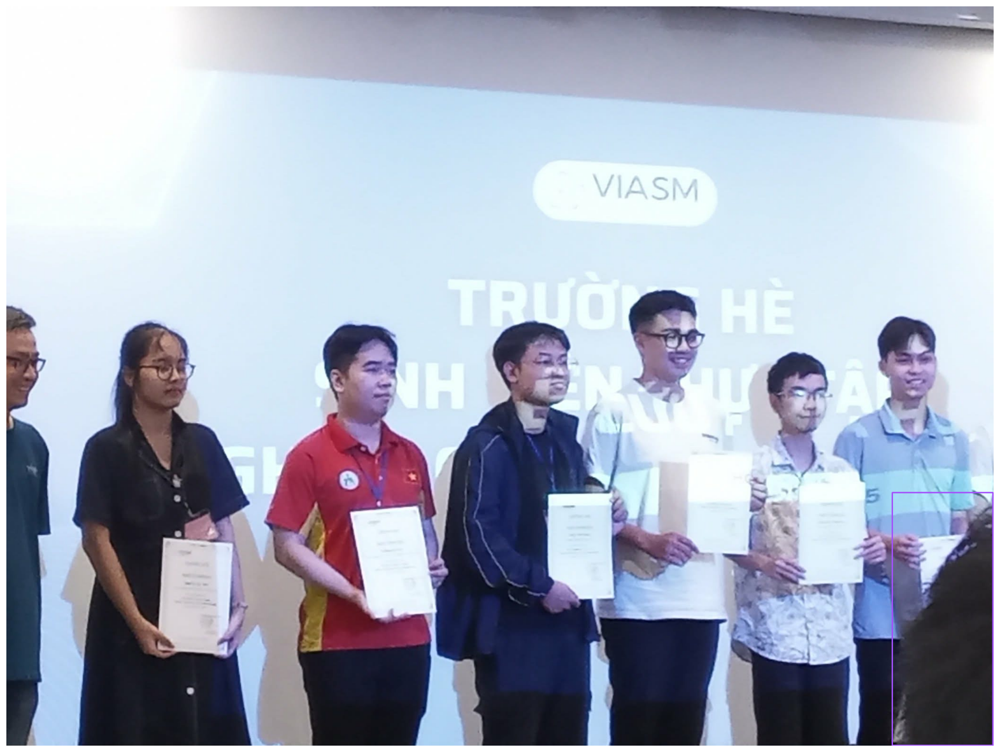

In [24]:
#"Man, upper body red t shirt"
#"Man, upper body wears blue t shirt"
#"Woman, upper body ears black t shirt, head wears glasses"
#"Man, uppder body wears black coat, head wears glasses"

text = "Man, uppder body wears black coat, head wears glasses"

zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'self1.jpg')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### self2

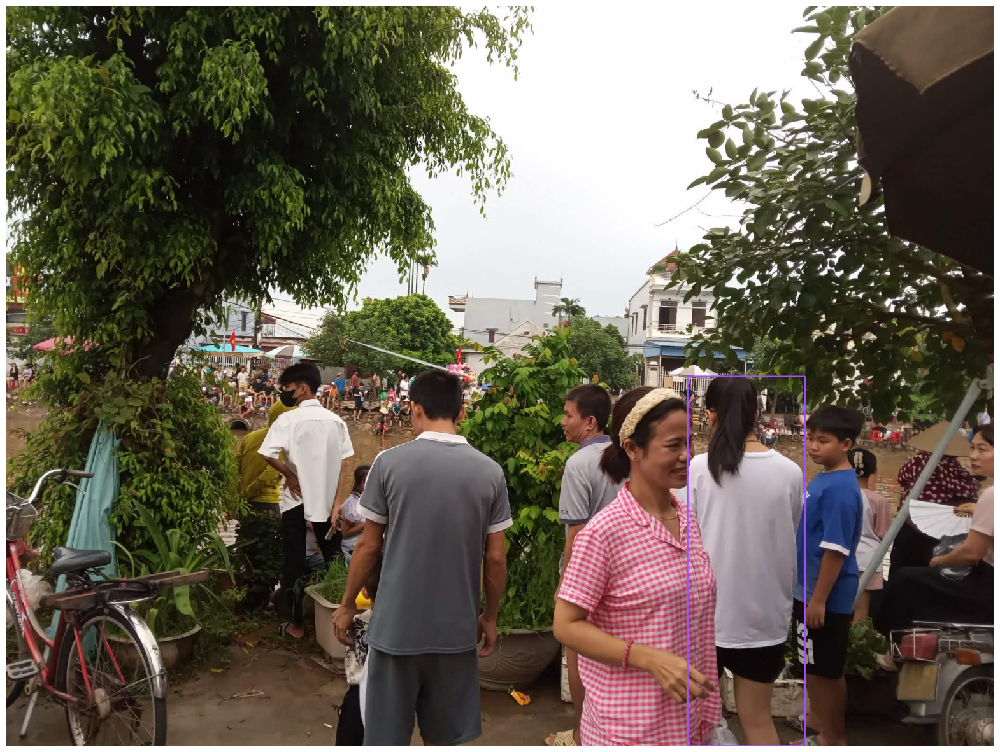

In [25]:
#"Man, wears grey shirt" #1
#"Man, wears white shirt, wears mask on face"
#"Man, wears blue t shirt, lower bodys wears black short" #1
#"Woman. upper body wears pink shirt" | "Woman. upper body wears pink shirt, head wears white hairband" #2
#"Woman. upper body wears white shirt, lower body wears black short" #1

text = "Woman, upper body wears white shirt, lower body wears black short"

zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'self2.jpg')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### self3

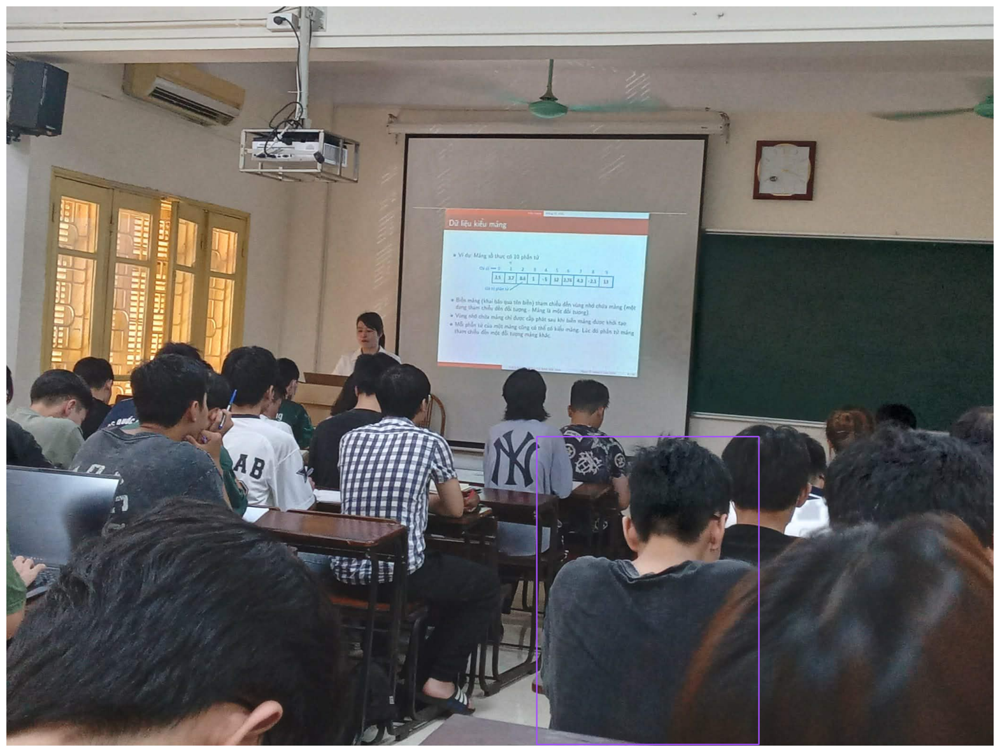

In [35]:
#"Man, upper body wears striped shirt" #1
#"Man, upper body wears white shirt" #1
#"Man, upper body wears white shirt, symbol behind the back of the shirt"
#"Man, upper body wears grey shirt" #1

text = "Man, upper body wears grey shirt"

zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'self3.jpg')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

### self4

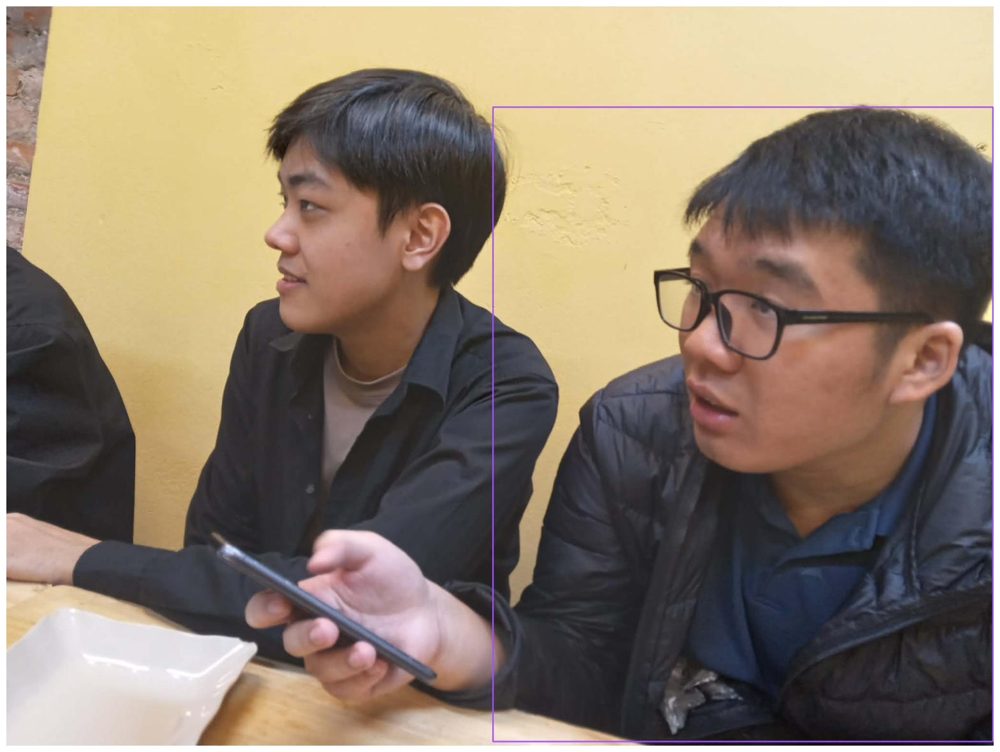

In [45]:
#"Man, head wears glasses" #1
#"Man, head doesnt wears glasses"

text = "Man, head does NOT glasses"

zeroshot_object_detection_img = zero_shot_object_detection(yolo, model, processor, text, 'self4.jpg')
sv.plot_image(zeroshot_object_detection_img, (20, 20))

In [43]:
cv2.imwrite('output.png', zeroshot_object_detection_img, )

True